In [2]:
import pulp
import random
import numpy as np
import matplotlib.pyplot as plt

In [3]:
# -------------------
# No Capacity Sharing
# -------------------
def no_capacity_sharing(verbose=False, plot=False, demand=None, simulation_params=None):
    """"""
    D = demand
    r = simulation_params["r"]
    alpha = simulation_params["alpha"]
    N = simulation_params["N"]
    C = simulation_params["C"]

    prob = pulp.LpProblem("Satellite_Capacity_Allocation", pulp.LpMaximize)

    # Define decision variables x_i
    x = [pulp.LpVariable(f"x_{i}", lowBound=0) for i in range(N)]

    # Define objective function
    objective = pulp.lpSum((r + alpha)*x[i] for i in range(N)) - alpha*sum(D)
    prob += objective

    # Add constraints
    for i in range(N):
        prob += x[i] <= D[i], f"Demand_Satisfaction_{i}"

    for i in range(N):
        prob += x[i] <= C, f"Capacity_Constraint_{i}"

    prob.solve()

    if verbose:
        # Display the status of the solution
        print(f"Status: {pulp.LpStatus[prob.status]}")

        # Display the optimized values of x_i
        print("\nOptimized demand satisfaction in each region:")
        for i in range(N):
            print(f"Region {i+1}: Satisfied Demand = {x[i].varValue:.2f} units, Demand = {D[i]:.2f} units")

    # Calculate the total profit
    total_revenue = r * sum(x[i].varValue for i in range(N))
    total_penalty = alpha * sum(max(D[i] - x[i].varValue, 0) for i in range(N))
    total_profit = total_revenue - total_penalty

    return {"revenue":total_revenue, "penalty":total_penalty, "profit":total_profit}


In [4]:
# ---------------------
# With Capacity Sharing
# ---------------------
def with_capacity_sharing(verbose=False, plot=False, demand=None, simulation_params=None):
    """"""
    D = demand
    r = simulation_params["r"]
    alpha = simulation_params["alpha"]
    N = simulation_params["N"]
    C = simulation_params["C"]

    prob = pulp.LpProblem("Satellite_Capacity_Sharing", pulp.LpMaximize)

    # Define decision variables x_i
    x = [pulp.LpVariable(f"x_{i}", lowBound=0) for i in range(N)]

    # Define objective function
    objective = pulp.lpSum((r + alpha) * x[i] for i in range(N)) - alpha * sum(D)
    prob += objective

    # Add constraints
    for i in range(N):
        prob += x[i] <= D[i], f"Demand_Satisfaction_{i}"

    # Total capacity constraint (shared capacity)
    prob += pulp.lpSum(x) <= N * C, "Total_Capacity_Constraint"

    # Solve the LP problem
    prob.solve()

    if verbose:
        # Display the status of the solution
        print(f"Status: {pulp.LpStatus[prob.status]}")

        # Display the optimized values of x_i
        print("\nOptimized demand satisfaction in each region:")
        for i in range(N):
            print(f"Region {i+1}: Satisfied Demand = {x[i].varValue:.2f} units, Demand = {D[i]:.2f} units")

    # Calculate the total profit
    total_revenue = r * sum(x[i].varValue for i in range(N))
    total_penalty = alpha * sum(max(D[i] - x[i].varValue, 0) for i in range(N))
    total_profit = total_revenue - total_penalty

    return {"revenue":total_revenue, "penalty":total_penalty, "profit":total_profit}

In [37]:
def generate_demand_matrix(N, mean, sigmas, trials, use_binomial=False, random_seed=0):
    # Set seeds for reproducibility
    # random.seed(random_seed)
    # np.random.seed(random_seed)

    if use_binomial:
        # Compute threshold using 'mean' (not undefined mean_demand)
        threshold = mean * (1 / N) * ((1 - 1 / N) ** (N - 1))
        print("Threshold:", threshold)

        # For each trial, simulate N Bernoulli experiments and count successes.
        # We generate trials * N random floats and reshape into a (trials, N) array.
        random_floats = np.random.rand(trials * N)
        thresholded_values = np.where(random_floats < threshold, 1.0, 0.0)
        reshaped_values = thresholded_values.reshape(trials, N)
        # Sum each row (each trial) to get the binomial outcome.
        binomial_demands = reshaped_values.sum(axis=1)

        # Replicate the same binomial results for each spread
        demand_matrix = np.array([binomial_demands for _ in spreads])
    else:
        # Generate a demand matrix with uniformly distributed values.
        # The result has shape: (len(spreads), trials, N)
        demand_matrix = np.array([
            [
                # [random.uniform(mean - spread, mean + spread) for _ in range(N)]
                [np.random.gamma(mean**2/sigma**2, (sigma**2)/mean) for _ in range(N)]
                for _ in range(trials)
            ]
            for sigma in sigmas
        ])

    return demand_matrix

In [39]:
def run_experiment(simulation_params, spreads=[], means=[], trials=0, enable_sharing=False):
  all_profits = []
  all_penalties = []
  all_revenues = []

  random.seed(simulation_params["random_seed"])
  np.random.seed(simulation_params["random_seed"])

  for mean in means:
    demand_matrix = generate_demand_matrix(simulation_params["N"], mean, spreads, trials, use_binomial=False, random_seed=simulation_params["random_seed"])
    # print("mean", mean)
    print("demand_matrix")
    print(demand_matrix)
    print("-------")
    flattened_demand_matrix = []
    for elt in demand_matrix[0][0]:
        flattened_demand_matrix.append(float(elt))
    print("flattened_demand_matrix", flattened_demand_matrix)
    
    mean_profits = []
    mean_penalties = []
    mean_revenues = []
    for spread_idx in range(len(spreads)):
      profits = []
      penalties = []
      revenues = []
      for trial_idx in range(trials):
        demand = demand_matrix[spread_idx, trial_idx]
        # print("spread", spreads[spread_idx], ":", demand)
        if enable_sharing:
          result = with_capacity_sharing(verbose=False, plot=False, demand=demand, simulation_params=simulation_params)
        else:
          result = no_capacity_sharing(verbose=False, plot=False, demand=demand, simulation_params=simulation_params)
        profits.append(result["profit"])
        penalties.append(result["penalty"])
        revenues.append(result["revenue"])
      mean_profits.append(np.mean(profits)) # TODO: consider saving the std. dev. as well?
      mean_penalties.append(np.mean(penalties))
      mean_revenues.append(np.mean(revenues))
    all_profits.append(mean_profits)
    all_penalties.append(mean_penalties)
    all_revenues.append(mean_revenues)

  return all_profits, all_penalties, all_revenues


def plot_experiment(experiment_1, experiment_2, espreads, means):
  """
    params:
      experiment_1: the baseline
      experiment_2: the experiment to compare to the baseline

    notes:
      assuming same set of spreads and means for both experiments

  """
  pass


Generate an upper bounds for three stage algorithm

In [52]:
simulation_params = {
    "N": 25,
    "C": 10*25,
    "r": 100,
    "alpha": 100,
    "beta": 1,
    "random_seed": 15,
}
# baseline = run_experiment(simulation_params,
#                spreads=[5, 10, 30, 60, 90, 120],
#                means=[10, 50, 100, 300],
#                trials=1,
#                enable_sharing=True)

baseline = run_experiment(simulation_params,
               spreads=[80],
               means=[300],
               trials=5000,
               enable_sharing=True)

baseline_profits, baseline_penalties, baseline_revenues = baseline

print("baseline_profits", baseline_profits)
print("baseline_penalties", baseline_penalties)
print("baseline_revenues", baseline_revenues)


demand_matrix
[[[268.88770544 320.53496167 311.90710887 ... 343.20243731 220.85831183
   271.87210375]
  [419.75967854 235.27982878 273.5442383  ... 217.36893759 250.59258908
   207.08785623]
  [245.73278894 316.11323113 334.00539402 ... 299.33666548 261.07883996
   182.21826718]
  ...
  [252.26451317 224.9041262  305.97034396 ... 312.40065908 302.05130679
   207.92834358]
  [248.07536026 389.50101493 394.30266157 ... 314.31502242 286.34733012
   242.99787042]
  [380.56090299 234.82447214 432.9466506  ... 268.67547716 194.63524848
   344.63296064]]]
-------
flattened_demand_matrix [268.8877054423857, 320.5349616676382, 311.90710886570605, 174.43066267895998, 269.4225550123782, 257.0142233984381, 350.84339508483487, 326.55800743504045, 280.19726379074723, 438.4628261493513, 286.00489430341645, 221.91329471618306, 321.3514225089097, 169.17393977712868, 427.82821347129607, 407.1431173125805, 192.56440494549486, 178.35966398589804, 311.22302321199464, 255.85772035110054, 234.55647967681367

In [ ]:
print("revenue", baseline_revenues)
print("penalties", baseline_penalties)
print("profits", baseline_profits)


revenue [[np.float64(24999.999900000003), np.float64(24999.9999), np.float64(24999.9999), np.float64(24999.999553), np.float64(25000.0), np.float64(25000.0)]]
penalties [[np.float64(102668.42662791208), np.float64(92492.90269757951), np.float64(118125.72983680441), np.float64(130190.29204459456), np.float64(139853.62083172644), np.float64(62931.83450094843)]]
profits [[np.float64(-77668.42672791207), np.float64(-67492.90279757952), np.float64(-93125.72993680442), np.float64(-105190.29249159456), np.float64(-114853.62083172644), np.float64(-37931.83450094843)]]


Generate 4x2 matrix of plots

In [9]:
# spreads = [5, 10, 30, 60, 90, 120, 130, 150, 180, 210, 300] # standard deviations
# spreads = [5, 10, 30, 60, 90, 120]
spreads = [5, 10, 15, 20, 25]
# means = [5, 10, 100, 300]
means = [10, 50, 100, 300]
num_trials = 50

In [ ]:
simulation_params = {
    "N": 25,
    "C": 10,
    "r": 100,
    "alpha": 100,
    "beta": 1,
    "random_seed": 0,
}
debug_1 = run_experiment(simulation_params,
               spreads=[5, 10, 30, 60, 90, 120],
               means=[10],
               trials=1,
               enable_sharing=True)

debug_1

([[np.float64(23040.21167194396),
   np.float64(20925.658402948484),
   np.float64(14394.357085255218),
   np.float64(4216.553210509036),
   np.float64(-9323.681088295554),
   np.float64(-5859.196920383164)]],
 [[np.float64(823.9627620660411),
   np.float64(1752.784908803915),
   np.float64(4436.175166840871),
   np.float64(10224.780212056223),
   np.float64(22189.75359872052),
   np.float64(13863.392017473077)]],
 [[np.float64(23864.17443401),
   np.float64(22678.4433117524),
   np.float64(18830.532252096087),
   np.float64(14441.33342256526),
   np.float64(12866.072510424969),
   np.float64(8004.195097089916)]])

In [ ]:
simulation_params = {
    "N": 25,
    "C": 10,
    "r": 100,
    "alpha": 500,
    "beta": 1,
    "random_seed": 0,
}
debug_1 = run_experiment(simulation_params,
               spreads=[5, 10, 30, 60, 90, 120],
               means=[10],
               trials=1,
               enable_sharing=True)

debug_1

([[6752.257033151876,
   19441.00351490889,
   17901.513805993993,
   15615.391239827819,
   -46432.354878613376,
   5993.712776858562]],
 [[18247.742866848123,
   0.00026709110806377723,
   0.00027252911097021395,
   0.0012737042761025922,
   71432.35487861338,
   1.7212647005865358e-05]],
 [[24999.9999,
   19441.003782,
   17901.514078523105,
   15615.392513532095,
   25000.0,
   5993.71279407121]])

In [10]:
simulation_params = {
    "N": 25,
    "C": 10,
    "r": 100,
    "alpha": 100,
    "beta": 1,
    "random_seed": 0,
}
baseline = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=num_trials,
               enable_sharing=False)

simulation_params = {
    "N": 25,
    "C": 10,
    "r": 100,
    "alpha": 100,
    "beta": 1,
    "random_seed": 0,
}
sharing_only = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=num_trials,
               enable_sharing=True)


simulation_params = {
    "N": 25,
    "C": 10*25,
    "r": 100,
    "alpha": 100,
    "beta": 1,
    "random_seed": 0,
}
nulling_only = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=num_trials,
               enable_sharing=False)


simulation_params = {
    "N": 25,
    "C": 10*25,
    "r": 100,
    "alpha": 100,
    "beta": 1,
    "random_seed": 0,
}
sharing_and_nulling = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=num_trials,
               enable_sharing=True)



demand_matrix [[[2.04701035e+01 1.12188100e+01 2.13283626e+01 ... 5.00757520e+00
   3.91076485e+00 6.93694584e+00]
  [7.22540464e+00 3.40800631e+00 8.18549989e+00 ... 3.60384809e+00
   1.60467810e+01 8.33203789e+00]
  [7.36889465e+00 1.63523210e+01 1.09806602e+01 ... 5.95288131e+00
   1.19980328e+01 6.44727144e+00]
  ...
  [7.12854157e+00 6.48275801e+00 8.86527534e+00 ... 1.00285693e+01
   9.47596128e+00 3.42431302e+00]
  [5.94112687e+00 3.72413840e+00 6.16585059e+00 ... 6.50332790e+00
   2.02299410e+01 4.85014544e+00]
  [1.21901615e+01 5.63110091e+00 6.93717263e+00 ... 1.10305463e+01
   1.88230401e+01 1.40832851e+01]]

 [[2.74574552e+01 4.03358032e+00 4.23190852e-01 ... 3.40522340e+01
   2.72662731e+01 2.54526254e+01]
  [7.84087488e-02 8.89194885e+00 2.96564897e+00 ... 3.18413413e+01
   4.24898529e+00 3.47449419e+00]
  [8.53130144e-01 1.09210717e+01 3.19324752e+01 ... 4.32376030e+00
   1.61242987e+01 4.54198861e+00]
  ...
  [1.19612660e+01 1.09319939e+01 3.17394390e+00 ... 5.39193801e

In [11]:
# saved to use for normalization
# no penalty and no nulling
simulation_params = {
    "N": 25,
    "C": 10,
    "r": 100,
    "alpha": 0,
    "beta": 1,
    "random_seed": 0,
}
baseline_for_normalization = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=50,
               enable_sharing=False)


baseline_profits_nopenalty, baseline_penalties_nopenalty, baseline_revenues_nopenalty = baseline_for_normalization

demand_matrix [[[2.04701035e+01 1.12188100e+01 2.13283626e+01 ... 5.00757520e+00
   3.91076485e+00 6.93694584e+00]
  [7.22540464e+00 3.40800631e+00 8.18549989e+00 ... 3.60384809e+00
   1.60467810e+01 8.33203789e+00]
  [7.36889465e+00 1.63523210e+01 1.09806602e+01 ... 5.95288131e+00
   1.19980328e+01 6.44727144e+00]
  ...
  [7.12854157e+00 6.48275801e+00 8.86527534e+00 ... 1.00285693e+01
   9.47596128e+00 3.42431302e+00]
  [5.94112687e+00 3.72413840e+00 6.16585059e+00 ... 6.50332790e+00
   2.02299410e+01 4.85014544e+00]
  [1.21901615e+01 5.63110091e+00 6.93717263e+00 ... 1.10305463e+01
   1.88230401e+01 1.40832851e+01]]

 [[2.74574552e+01 4.03358032e+00 4.23190852e-01 ... 3.40522340e+01
   2.72662731e+01 2.54526254e+01]
  [7.84087488e-02 8.89194885e+00 2.96564897e+00 ... 3.18413413e+01
   4.24898529e+00 3.47449419e+00]
  [8.53130144e-01 1.09210717e+01 3.19324752e+01 ... 4.32376030e+00
   1.61242987e+01 4.54198861e+00]
  ...
  [1.19612660e+01 1.09319939e+01 3.17394390e+00 ... 5.39193801e

In [12]:
baseline_profits, baseline_penalties, baseline_revenues = baseline
sharing_only_profits, sharing_only_penalties, sharing_only_revenues = sharing_only
nulling_only_profits, nulling_only_penalties, nulling_only_revenues = nulling_only
sharing_and_nulling_profits, sharing_and_nulling_penalties, sharing_and_nulling_revenues = sharing_and_nulling

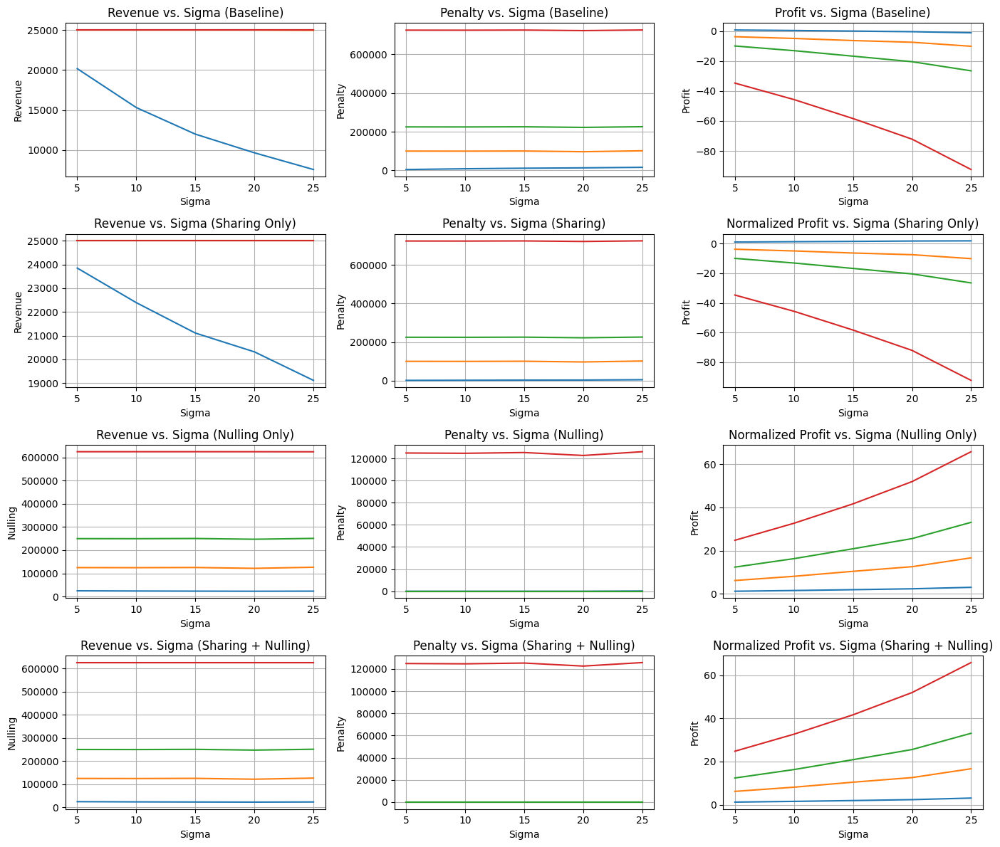

In [13]:
sigmas = spreads

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(14, 12))  # Adjust figsize as needed

# Revenue vs. Sigma (Baseline)
ax = axes[0][0]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      baseline_revenues[mean_idx][k]
      for k in range(len(baseline_revenues[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Revenue")
ax.set_title(f"Revenue vs. Sigma (Baseline)")
# ax.legend()
ax.grid()

# Penalty vs. Sigma (Baseline)
ax = axes[0][1]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      baseline_penalties[mean_idx][k]
      for k in range(len(baseline_penalties[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Penalty")
ax.set_title(f"Penalty vs. Sigma (Baseline)")
# ax.legend()
ax.grid()

# Profit vs. Sigma (Baseline)
ax = axes[0][2]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      baseline_profits[mean_idx][k] / baseline_profits_nopenalty[0][k] # use baseline m=1 for normalization
      # baseline_profits[mean_idx][k]
      for k in range(len(baseline_profits[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Profit")
ax.set_title(f"Profit vs. Sigma (Baseline)")
# ax.legend()
ax.grid()

# Revenue vs. Sigma (Sharing)
ax = axes[1][0]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      sharing_only_revenues[mean_idx][k]
      for k in range(len(sharing_only_revenues[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Revenue")
ax.set_title(f"Revenue vs. Sigma (Sharing Only)")
# ax.legend()
ax.grid()

# Penalty vs. Sigma (Sharing)
ax = axes[1][1]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      sharing_only_penalties[mean_idx][k]
      for k in range(len(sharing_only_penalties[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Penalty")
ax.set_title(f"Penalty vs. Sigma (Sharing)")
# ax.legend()
ax.grid()

# Profit vs. Sigma (Sharing)
ax = axes[1][2]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      (sharing_only_profits[mean_idx][k] ) / baseline_profits_nopenalty[0][k] # use baseline m=1 for normalization
      # (sharing_only_profits[mean_idx][k] )
      for k in range(len(sharing_only_profits[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Profit")
ax.set_title(f"Normalized Profit vs. Sigma (Sharing Only)")
# ax.legend()
ax.grid()

# Revenue vs. Sigma (Nulling)
ax = axes[2][0]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      nulling_only_revenues[mean_idx][k]
      for k in range(len(nulling_only_revenues[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Nulling")
ax.set_title(f"Revenue vs. Sigma (Nulling Only)")
# ax.legend()
ax.grid()

# Penalty vs. Sigma (Nulling)
ax = axes[2][1]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      nulling_only_penalties[mean_idx][k]
      for k in range(len(nulling_only_penalties[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Penalty")
ax.set_title(f"Penalty vs. Sigma (Nulling)")
# ax.legend()
ax.grid()

# Profit vs. Sigma (Nulling)
ax = axes[2][2]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      (nulling_only_profits[mean_idx][k]) / baseline_profits_nopenalty[0][k] # use baseline m=1 for normalization
      # (nulling_only_profits[mean_idx][k])
      for k in range(len(nulling_only_profits[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Profit")
ax.set_title(f"Normalized Profit vs. Sigma (Nulling Only)")
# ax.legend()
ax.grid()

# Revenue vs. Sigma (Sharing + Nulling)
ax = axes[3][0]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      sharing_and_nulling_revenues[mean_idx][k]
      for k in range(len(sharing_and_nulling_revenues[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Nulling")
ax.set_title(f"Revenue vs. Sigma (Sharing + Nulling)")
# ax.legend()
ax.grid()

# Penalty vs. Sigma (Sharing + Nulling)
ax = axes[3][1]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      sharing_and_nulling_penalties[mean_idx][k]
      for k in range(len(sharing_and_nulling_penalties[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Penalty")
ax.set_title(f"Penalty vs. Sigma (Sharing + Nulling)")
# ax.legend()
ax.grid()

# Profit vs. Sigma (Sharing + Nulling)
ax = axes[3][2]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      (sharing_and_nulling_profits[mean_idx][k]) / baseline_profits_nopenalty[0][k] # use baseline m=1 for normalization
      # (sharing_and_nulling_profits[mean_idx][k])
      for k in range(len(sharing_and_nulling_profits[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Profit")
ax.set_title(f"Normalized Profit vs. Sigma (Sharing + Nulling)")
# ax.legend()
ax.grid()

# Adjust layout for better spacing
plt.tight_layout()
plt.show()



In [ ]:
demand_matrix = generate_demand_matrix(25, 300, [15], 1, use_binomial=False, random_seed=simulation_params["random_seed"])
demand_matrix

array([[[326.98535525, 305.7899771 , 328.63268886, 285.33441219,
         298.20502448, 305.94865472, 311.30621545, 301.57806833,
         306.45454892, 304.78091527, 322.71454837, 296.68441903,
         263.0774311 , 309.65738527, 335.0863244 , 278.4681271 ,
         323.32446303, 322.32535784, 286.63483225, 271.02052558,
         318.57766053, 318.14202593, 284.30152433, 278.95874204,
         292.17315566]]])

In [ ]:
 # CHANGE ME: Parameters
N = 25  # Number of satellites/regions
# C = 12    # Capacity of each satellite
r = 100  # Revenue per unit of satisfied demand
alpha = 100 # Penalty per unit of unsatisfied demand
beta = 1  # Cost multiplier for sharing capacity
# random.seed(0)  # For reproducibility
random.seed(512)  # For reproducibility


trials = 50
# spreads = [1,2,3,4,5,6,7,8,9,10]
# spreads = []
spreads = [5, 10, 30, 60, 90, 120, 130, 150, 180, 210, 300, ]
# spreads = [50, 100, 150, 200, 250, 300]
# spreads = [10,
# means = [10,11,12,13,14]
# means = [200, 201, 202, 203, 204]

# means = [50, 100, 150, 200, 250, 300]
means = [5, 10, 50, 70, 100, 200, 250, 300]

all_means_cap_sharing = []
all_means_nocap_sharing = []

all_penalties_cap_sharing = []
all_penalties_nocap_sharing = []

for mean in means:
  demand_matrix = generate_demand_matrix(N, mean, spreads, trials, use_binomial=False)

  means_with_sharing = []
  means_without_sharing = []

  mean_penalties_with_sharing = []
  mean_penalties_without_sharing = []

  for spread_idx in range(len(spreads)):
    revenues_with_sharing = []
    penalties_with_sharing = []
    profits_with_sharing = []

    revenues_without_sharing = []
    penalties_without_sharing = []
    profits_without_sharing = []

    for trial_idx in range(trials):
      demand = demand_matrix[spread_idx, trial_idx]
      # print("demand", demand)
      # Problem 1
      # result = with_capacity_sharing_and_share_cost(verbose=False, plot=True) # CHANGE ME
      # Problem 2
      with_sharing_result = with_capacity_sharing(verbose=False, plot=False, demand=demand, sat_capacity=10*25) # CHANGE ME
      # Problem 3
      without_sharing_result = no_capacity_sharing(verbose=False, plot=False, demand=demand, sat_capacity=10*25) # CHANGE ME
      revenues_with_sharing.append(with_sharing_result["revenue"])
      penalties_with_sharing.append(with_sharing_result["penalty"])
      profits_with_sharing.append(with_sharing_result["profit"])

      revenues_without_sharing.append(without_sharing_result["revenue"])
      penalties_without_sharing.append(without_sharing_result["penalty"])
      profits_without_sharing.append(without_sharing_result["profit"])



    means_with_sharing.append(np.mean(profits_with_sharing))
    means_without_sharing.append(np.mean(profits_without_sharing))

    mean_penalties_with_sharing.append(np.mean(penalties_with_sharing))
    mean_penalties_without_sharing.append(np.mean(penalties_without_sharing))

  all_means_cap_sharing.append(means_with_sharing)
  all_means_nocap_sharing.append(means_without_sharing)

  all_penalties_cap_sharing.append(mean_penalties_with_sharing)
  all_penalties_nocap_sharing.append(mean_penalties_without_sharing)






KeyboardInterrupt: 

In [ ]:
no_nulling_all_means_cap_sharing = []
no_nulling_all_means_nocap_sharing = []
no_nulling_all_penalties_cap_sharing = []
no_nulling_all_penalties_nocap_sharing = []


nulling_all_means_cap_sharing = []
nulling_all_means_nocap_sharing = []
nulling_all_penalties_cap_sharing = []
nulling_all_penalties_nocap_sharing = []

In [ ]:
nulling_all_means_cap_sharing = all_means_cap_sharing
nulling_all_means_nocap_sharing = all_means_nocap_sharing
nulling_all_penalties_cap_sharing = all_penalties_cap_sharing
nulling_all_penalties_nocap_sharing = all_penalties_nocap_sharing

In [ ]:
no_nulling_all_means_cap_sharing = all_means_cap_sharing
no_nulling_all_means_nocap_sharing = all_means_nocap_sharing
no_nulling_all_penalties_cap_sharing = all_penalties_cap_sharing
no_nulling_all_penalties_nocap_sharing = all_penalties_nocap_sharing

mean: 5
nulling_all_means_cap_sharing[mean_idx] [12433.224381109116, 14369.872744807615, 26587.46772846819, 43608.07566944521, 62953.81104898839, 82511.38878671899, 87969.8824251423, 91262.6997943251, 118476.9189316558, 134195.125530341, 185330.27932068918]
nulling_all_means_nocap_sharing[mean_idx] [12433.224381109116, 14369.872744807615, 26587.46772846819, 43608.07566944521, 62953.81104898839, 82511.38878671899, 87969.8824251423, 91262.6997943251, 118476.9189316558, 134195.125530341, 173414.0594728298]
mean: 10
nulling_all_means_cap_sharing[mean_idx] [24933.224245043515, 25366.43838626106, 34668.87302635514, 50644.45651960732, 69730.0163797142, 89411.86883123298, 94667.15150338403, 97438.21013280252, 125139.3032582213, 140679.07004706783, 191641.8549662627]
nulling_all_means_nocap_sharing[mean_idx] [24933.224245043515, 25366.43838626106, 34668.87302635514, 50644.45651960732, 69730.0163797142, 89411.86883123298, 94667.15150338403, 97438.21013280252, 125139.3032582213, 140679.0700470678

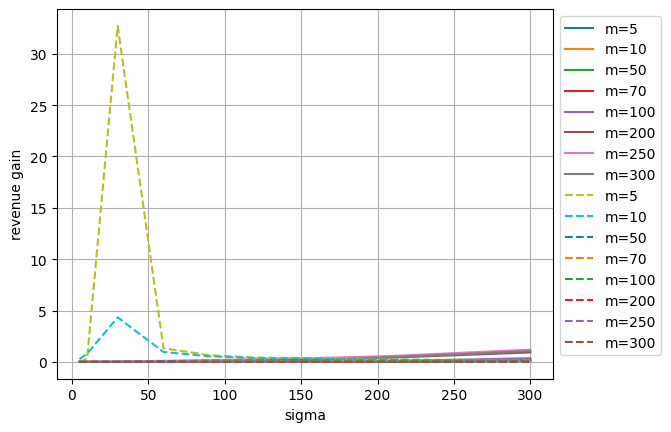

In [ ]:
# plot revenues
sigmas = [spread*2/(12**0.5) for spread in spreads]

for mean_idx in range(len(means)):
  print("mean:", means[mean_idx])
  print("nulling_all_means_cap_sharing[mean_idx]", nulling_all_means_cap_sharing[mean_idx])
  print("nulling_all_means_nocap_sharing[mean_idx]", nulling_all_means_nocap_sharing[mean_idx])
  # gains = [nulling_all_means_cap_sharing[mean_idx][i]/nulling_all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  gains = [(nulling_all_means_cap_sharing[mean_idx][i] - nulling_all_means_nocap_sharing[mean_idx][i])/abs(nulling_all_means_nocap_sharing[mean_idx][i]) for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")

print("---")
for mean_idx in range(len(means)):
  print("mean:", means[mean_idx])
  print("no_nulling_all_means_cap_sharing[mean_idx]", no_nulling_all_means_cap_sharing[mean_idx])
  print("no_nulling_all_means_nocap_sharing[mean_idx]", no_nulling_all_means_nocap_sharing[mean_idx])
  # gains = [no_nulling_all_means_cap_sharing[mean_idx][i]/no_nulling_all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  gains = [(no_nulling_all_means_cap_sharing[mean_idx][i]-no_nulling_all_means_nocap_sharing[mean_idx][i])/abs(no_nulling_all_means_nocap_sharing[mean_idx][i]) for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}", linestyle='--')

# plt.yscale("log")
plt.xlabel("sigma")
plt.ylabel("revenue gain")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.show()






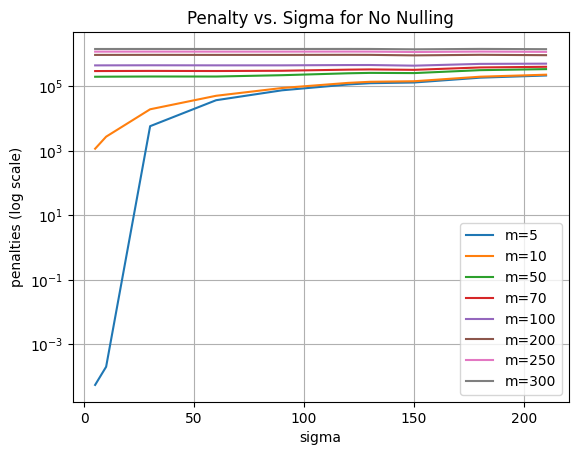

In [ ]:
for mean_idx in range(len(means)):
  gains = [no_nulling_all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")


plt.xlabel("sigma")
plt.ylabel("penalties (log scale)")
plt.title("Penalty vs. Sigma for No Nulling")
plt.yscale("log")
plt.legend()
plt.grid()
plt.show()

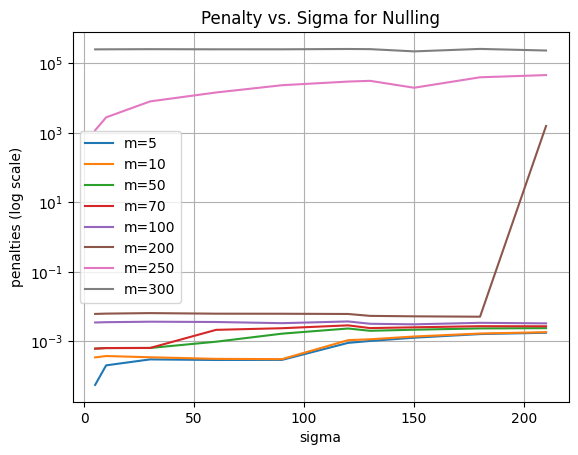

In [ ]:
for mean_idx in range(len(means)):
  gains = [nulling_all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")


plt.xlabel("sigma")
plt.ylabel("penalties (log scale)")
plt.title("Penalty vs. Sigma for Nulling")
plt.yscale("log")
plt.legend()
plt.grid()
plt.show()

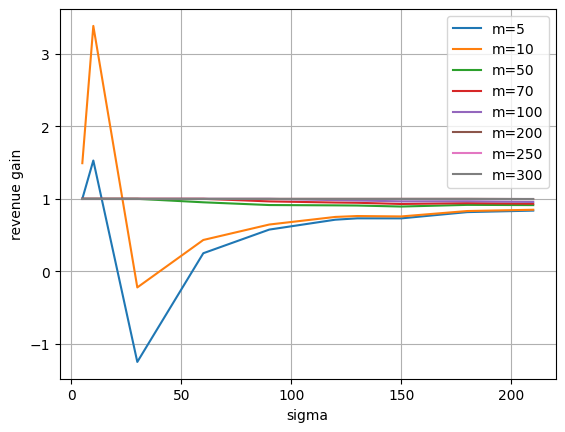

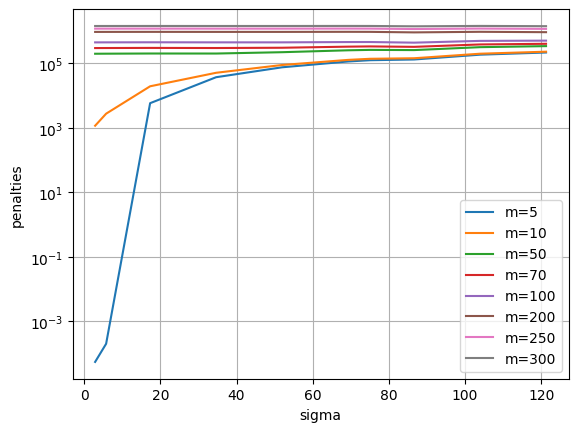

In [ ]:
# plot revenues
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_means_cap_sharing[mean_idx][i]/all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("revenue gain")  `


# plt.yscale("log")
plt.legend()
plt.grid()
plt.show()


# plot penalties
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("penalties")

plt.yscale("log")
plt.legend()
plt.grid()
plt.show()


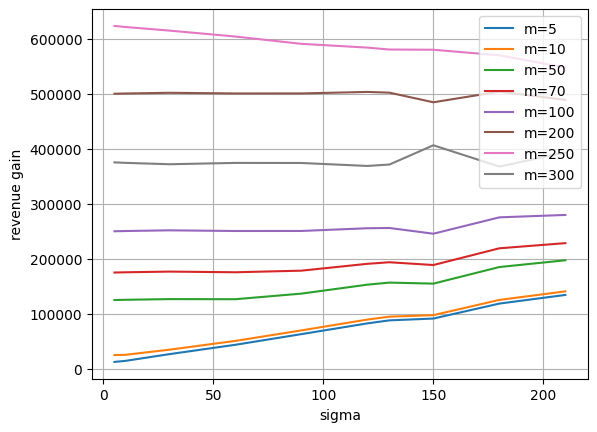

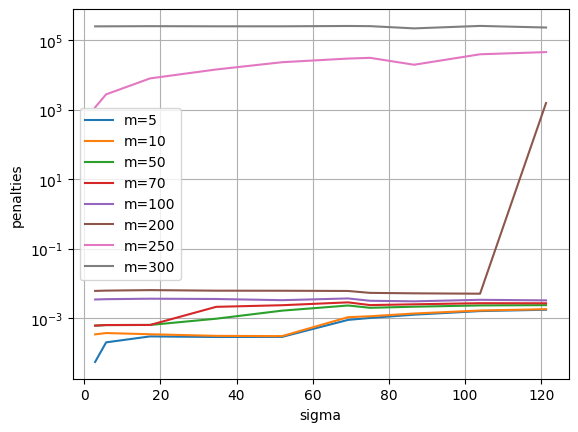

In [ ]:
# plot revenues
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  # gains = [all_means_cap_sharing[mean_idx][i]/all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("revenue gain")


# plt.yscale("log")
plt.legend()
plt.grid()
plt.show()


# plot penalties
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("penalties")

plt.yscale("log")
plt.legend()
plt.grid()
plt.show()


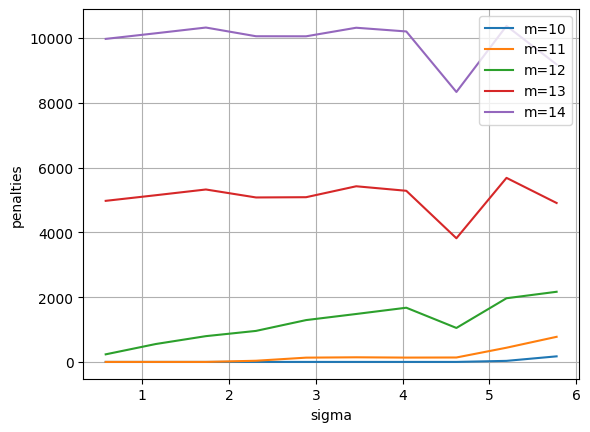

In [ ]:
# plot penalties
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("penalties")

plt.legend()
plt.grid()

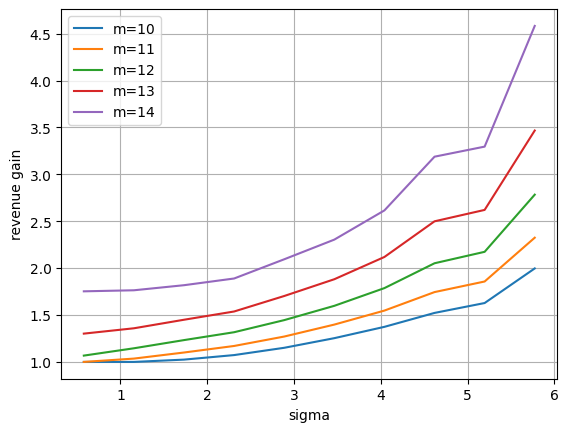

In [ ]:
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_means_cap_sharing[mean_idx][i]/all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("revenue gain")



plt.legend()
plt.grid()

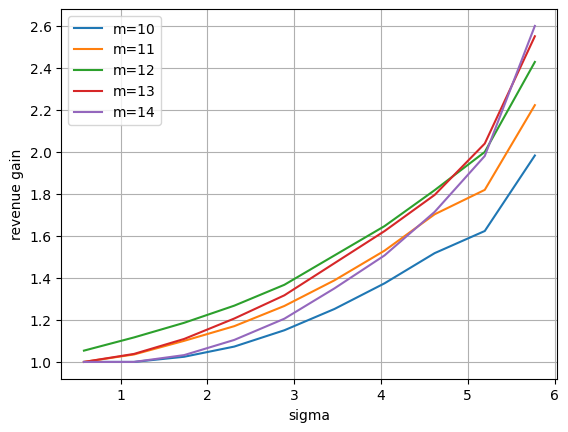

In [ ]:
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_means_cap_sharing[mean_idx][i]/all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("revenue gain")



plt.legend()
plt.grid()



In [ ]:
 # CHANGE ME: Parameters
N = 25  # Number of satellites/regions
C = 10    # Capacity of each satellite
r = 100  # Revenue per unit of satisfied demand
alpha = 200 # Penalty per unit of unsatisfied demand
beta = 1  # Cost multiplier for sharing capacity
random.seed(0)  # For reproducibility



# spreads = [1,2,3,4,5,6,7,8,9,10]
# spreads = [10,20,30,40,50,60,70,80,90,100]
means_without_sharing = []
for spread_idx in range(len(spreads)):

  revenues = []
  penalties = []
  profits = []

  for trial_idx in range(trials):
    demand = demand_matrix[spread_idx, trial_idx]
    # print("demand", demand)
    # Problem 1
    # result = with_capacity_sharing_and_share_cost(verbose=False, plot=True) # CHANGE ME
    # Problem 2
    # result = with_capacity_sharing(verbose=False, plot=False, demand=demand) # CHANGE ME
    # Problem 3
    result = no_capacity_sharing(verbose=False, plot=False, demand=demand) # CHANGE ME
    revenues.append(result["revenue"])
    penalties.append(result["penalty"])
    profits.append(result["profit"])

  # Calculate mean and standard deviation
  mean = np.mean(profits)
  std_dev = np.std(profits)

  means_without_sharing.append(mean)

  # # Plot the histogram
  # plt.figure(figsize=(8, 6))
  # plt.hist(penalties, bins=10, alpha=0.7, edgecolor='black', label='Data distribution')

  # # Add lines for mean and standard deviation
  # plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean:.2f}')
  # plt.axvline(mean - std_dev, color='blue', linestyle='dotted', linewidth=2, label=f'-1 SD: {mean - std_dev:.2f}')
  # plt.axvline(mean + std_dev, color='blue', linestyle='dotted', linewidth=2, label=f'+1 SD: {mean + std_dev:.2f}')

  # # Add labels and title
  # plt.title(f'Distribution of Penalties with Mean={round(mean,3)} and Std. Dev.={round(std_dev,3)}, N={N}')
  # plt.xlabel('Value')
  # plt.ylabel('Frequency')
  # plt.legend()
  # plt.grid(alpha=0.3)
  # plt.show()

  # # Calculate mean and standard deviation
  # mean = np.mean(profits)
  # std_dev = np.std(profits)

  # # Plot the histogram
  # plt.figure(figsize=(8, 6))
  # plt.hist(profits, bins=10, alpha=0.7, edgecolor='black', label='Data distribution')

  # # Add lines for mean and standard deviation
  # plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean:.2f}')
  # plt.axvline(mean - std_dev, color='blue', linestyle='dotted', linewidth=2, label=f'-1 SD: {mean - std_dev:.2f}')
  # plt.axvline(mean + std_dev, color='blue', linestyle='dotted', linewidth=2, label=f'+1 SD: {mean + std_dev:.2f}')

  # # Add labels and title
  # plt.title(f'Distribution of Profits with Mean={round(mean,3)} and Std. Dev.={round(std_dev,3)}, N={N}')
  # plt.xlabel('Value')
  # plt.ylabel('Frequency')
  # plt.legend()
  # plt.grid(alpha=0.3)
  # plt.show()


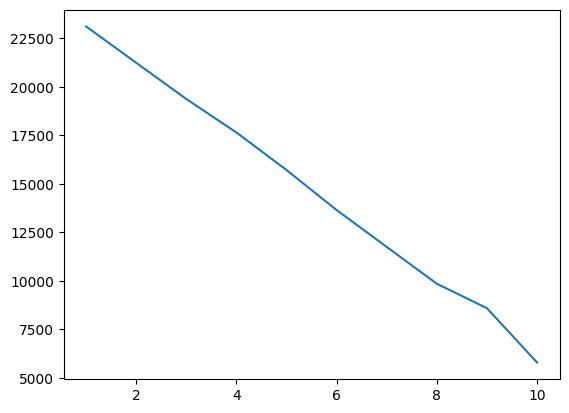

In [ ]:
plt.plot(spreads, means_without_sharing)

[1.0809624175581973,
 1.1750192567329854,
 1.2920236853442986,
 1.4324559726890482,
 1.600612411143589,
 1.8261290290756542,
 2.091913606985543,
 2.511264277372042,
 3.0748130962138736,
 4.031006495511688]

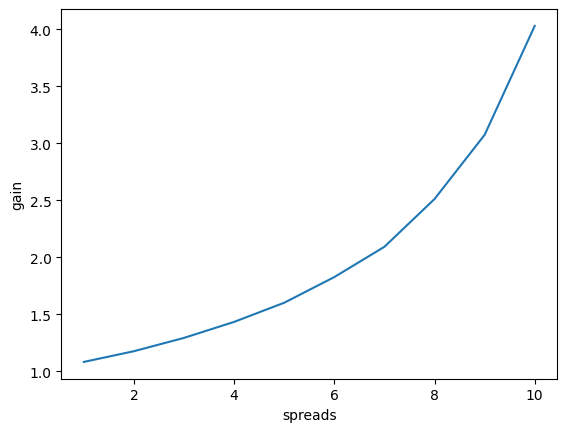

In [ ]:
gains = [means_with_sharing[i]/means_without_sharing[i] for i in range(len(means_with_sharing))]
gains

plt.plot(spreads, gains)
plt.xlabel("spreads")
plt.ylabel("gain")
gains